In [1]:
import sys
from pathlib import Path
parent_dir = Path.cwd().parent
sys.path.append(str(parent_dir))
sys.path.append('./../../RoboPoint/')

from robopoint_utils import load_model, get_coordinates, generate_prompt, do_inference_with_logits, calculate_probs_per_coordinate
from utils import extract_all, plot_scatter, calculate_euclidian_distance, calculate_normalized_euclidian_distance, visualize_points_on_image, close_all_images, calculate_all_clusters, show_all_clusters
from PIL import Image

2025-02-15 19:46:33.826771: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-02-15 19:46:34.624736: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-02-15 19:46:34.624768: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-02-15 19:46:34.624796: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-15 19:46:34.781717: I tensorflow/core/platform/cpu_feature_g

In [2]:
model_name = "wentao-yuan/robopoint-v1-vicuna-v1.5-13b"
model, processor, tokenizer = load_model(model_name)

Loading checkpoint shards:   0%|          | 0/6 [00:00<?, ?it/s]

Some weights of the model checkpoint at wentao-yuan/robopoint-v1-vicuna-v1.5-13b were not used when initializing LlavaLlamaForCausalLM: ['model.vision_tower.vision_tower.vision_model.embeddings.class_embedding', 'model.vision_tower.vision_tower.vision_model.embeddings.patch_embedding.weight', 'model.vision_tower.vision_tower.vision_model.embeddings.position_embedding.weight', 'model.vision_tower.vision_tower.vision_model.encoder.layers.0.layer_norm1.bias', 'model.vision_tower.vision_tower.vision_model.encoder.layers.0.layer_norm1.weight', 'model.vision_tower.vision_tower.vision_model.encoder.layers.0.layer_norm2.bias', 'model.vision_tower.vision_tower.vision_model.encoder.layers.0.layer_norm2.weight', 'model.vision_tower.vision_tower.vision_model.encoder.layers.0.mlp.fc1.bias', 'model.vision_tower.vision_tower.vision_model.encoder.layers.0.mlp.fc1.weight', 'model.vision_tower.vision_tower.vision_model.encoder.layers.0.mlp.fc2.bias', 'model.vision_tower.vision_tower.vision_model.encoder

In [3]:
def run_cluster_experiment(prompts, temperatures, runs_per_instance, epsilon, min_samples, experiment_path = "../data/first_experiments"):
    tasks, images, ground_truths, object_list = extract_all(experiment_path)

    list_of_distances = []
    list_of_diameters = []
    list_of_majority_size_rate = []
    labels = []
    for i in range(len(tasks)):
        print(f"Task: {i + 1}")
        print(tasks[i])
    
        image_path = images[i]
        task = tasks[i]
        objects = object_list[i]
        groundtruths = ground_truths[i]
    

        with Image.open(image_path) as image:
            width, height = image.size
            for object, groundtruth in zip(objects, groundtruths):
                coordinates_per_task = []
                image_labels = []

                for prompt_start in prompts:
                    prompt = generate_prompt(object, prompt_start)

                    for temperature in temperatures:
                    
                        for j in range(runs_per_instance):
                            generated_text, outputs = do_inference_with_logits(image, prompt, model, processor, tokenizer, temperature)
                            
                            coordinates = get_coordinates(generated_text, width, height)
                            if len(coordinates) == 0:
                                continue
                            
                            image_labels.append(f"{prompt_start}({temperature})")
                            coordinates_per_task.append(coordinates[0])

                n_clusters, index_majority_cluster, cluster_points, noisy_points, centroids, diameters = calculate_all_clusters(coordinates_per_task, epsilon=epsilon, min_samples=min_samples)
                if (n_clusters > 0):
                    distance = calculate_normalized_euclidian_distance(centroids[index_majority_cluster], groundtruth, width, height)
                    show_all_clusters(image, index_majority_cluster, cluster_points, noisy_points, centroids, diameters)
                
                    label = task + " (" + object + ")"
                    labels.append(label)
                    list_of_distances.append(distance)
                    list_of_diameters.append(diameters[index_majority_cluster])
                    list_of_majority_size_rate.append(len(cluster_points[index_majority_cluster]) / len(coordinates_per_task))
                else:
                    visualize_points_on_image(image, ["predictions"], [coordinates_per_task], object)
                
    plot_scatter(labels, list_of_diameters, list_of_distances, "Scatterplot of majority clusters per task", "Normalized distance of majority cluster to gt", "Diameter of the cluster")
    plot_scatter(labels, list_of_majority_size_rate, list_of_distances, "Scatterplot of Number of majority cluster size rate", "Normalized distance of majority cluster to gt", "majority cluster size rate")
    plot_scatter(labels, list_of_majority_size_rate, list_of_diameters, "Scatterplot of Number of of majority cluster size rate", "Diameter of the cluster", "majority cluster size rate")

Task: 1
pick up the wooden block and place it on top of the arch.


/home/kit/stud/uutqh/.local/lib/python3.9/site-packages/transformers/generation/utils.py:1493: UserWarning: You have modified the pretrained model configuration to control generation. This is a deprecated strategy to control generation and will be removed in v5. Please use and modify the model generation configuration (see https://huggingface.co/docs/transformers/generation_strategies#default-text-generation-configuration )
  warnings.warn(
From v4.47 onwards, when a model cache is to be returned, `generate` will return a `Cache` instance instead by default (as opposed to the legacy tuple of tuples format). If you want to keep returning the legacy format, please set `return_legacy_cache=True`.


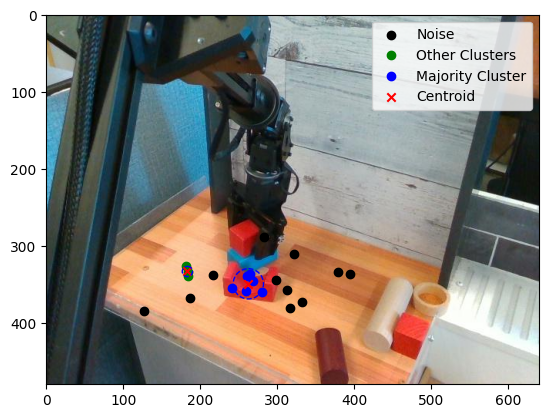

Didnt find any cluster


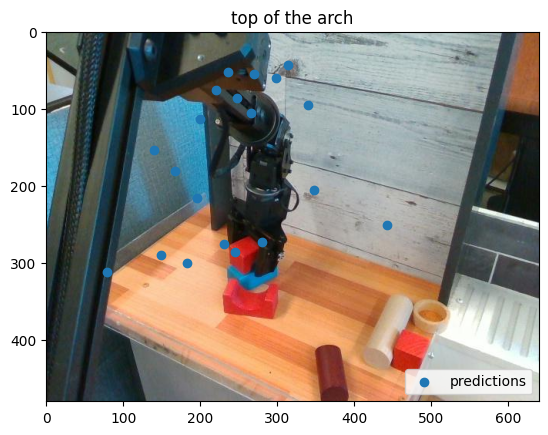

Task: 2
pick up vegetable and put it on the table.


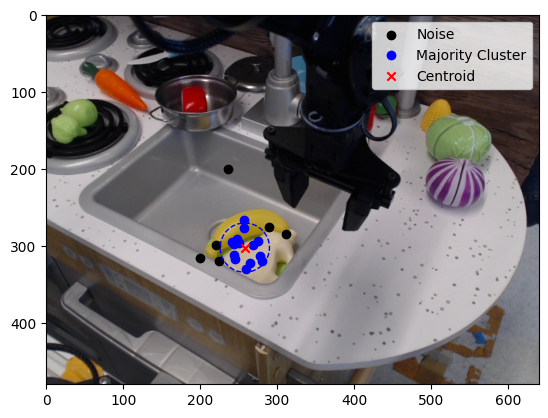

Didnt find any cluster


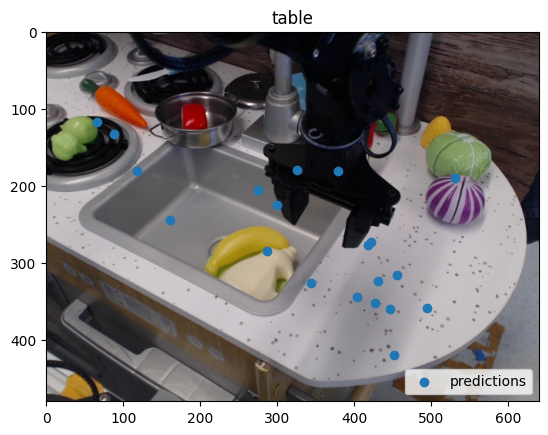

Task: 3
pick up glass cup


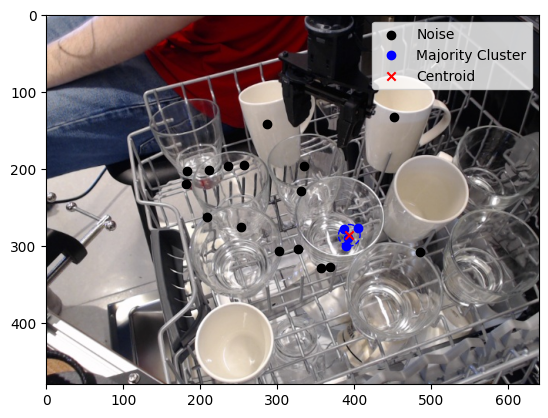

Task: 4
pick up red srewdriver


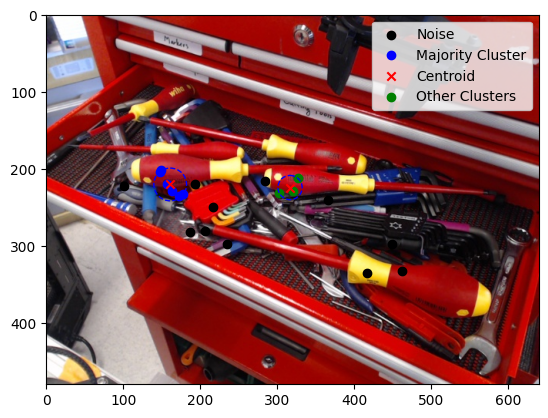

Task: 5
pick up the bean.


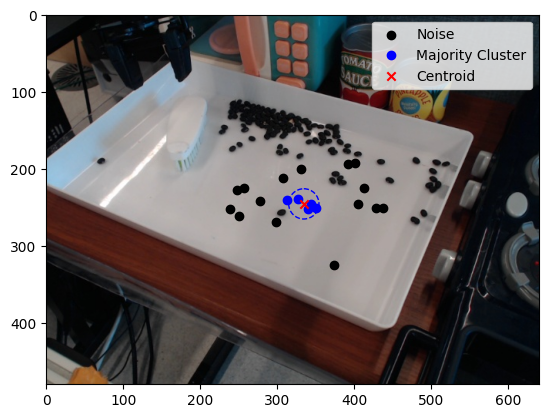

Task: 6
pick up the diamond.


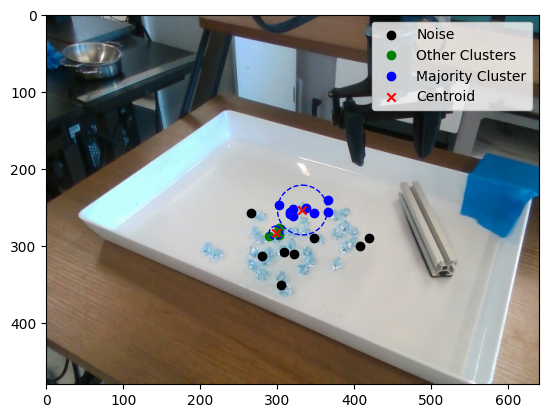

Task: 7
pick up vegetable and put it on the green cutting board.


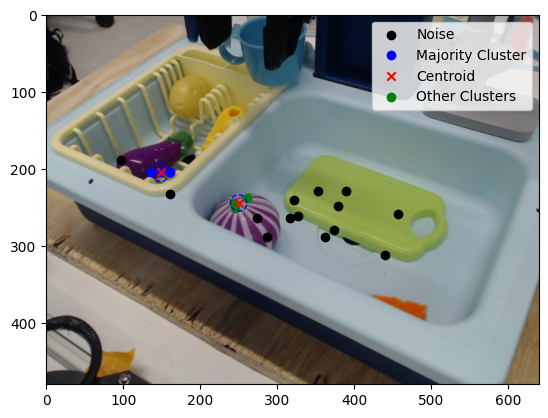

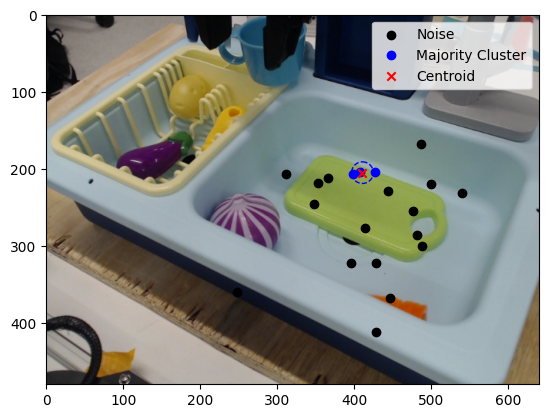

Task: 8
pick up cloth.


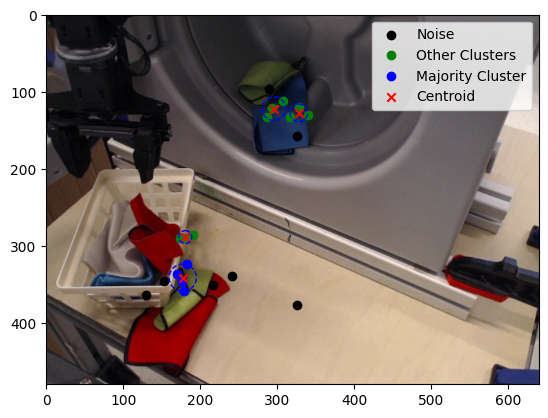

Task: 9
pick up vegetable from the sink and put it on the right side of the sink.


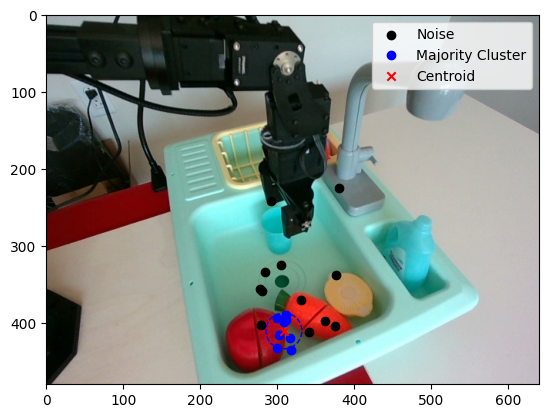

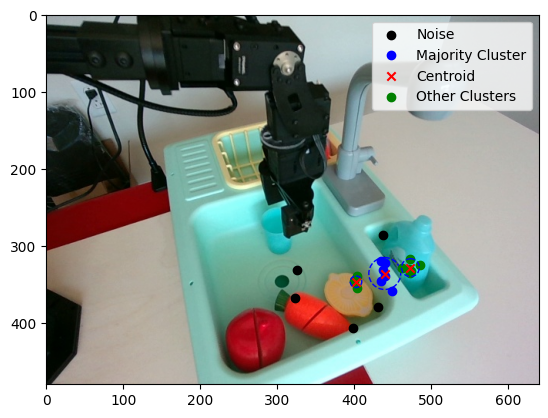

Task: 10
pick up the can and put it next to the tomato.


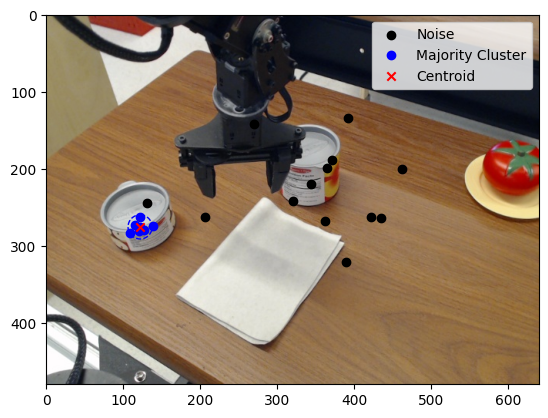

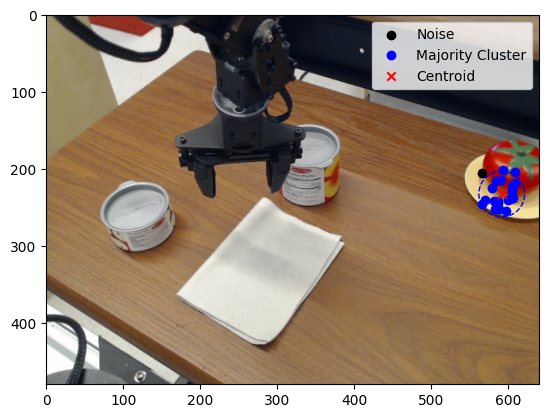

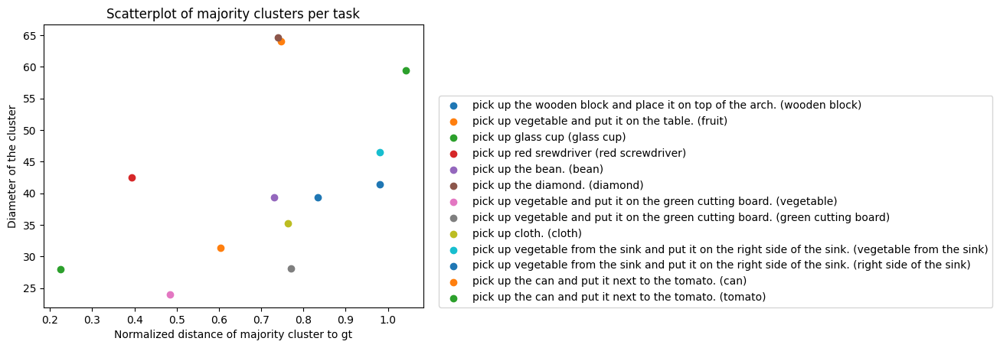

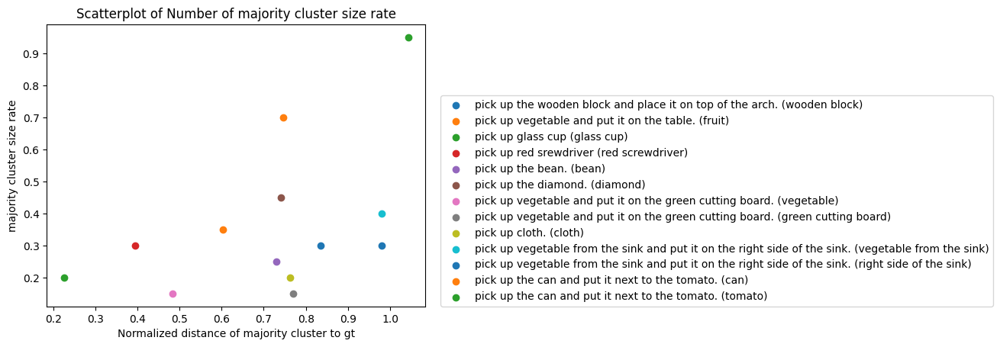

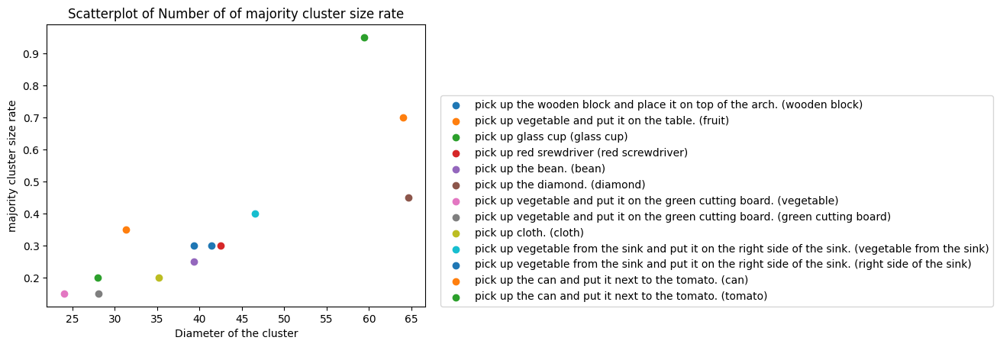

In [4]:
PROMPTS = [
    "Locate several points within the space of the ",
    "Locate several points within the area of the ",
    "Identify multiple points within the space of the ",
    "Identify several points within the area of the ",
    "Identify several spots within the space of the "
]

TEMPERATURES = [
    0.6
]


run_cluster_experiment(
    prompts = PROMPTS,
    temperatures = TEMPERATURES,
    runs_per_instance = 4,
    epsilon = 20,
    min_samples = 3,
    experiment_path = "../data/uncertain_experiments"
)

Task: 1
pull the oven tray


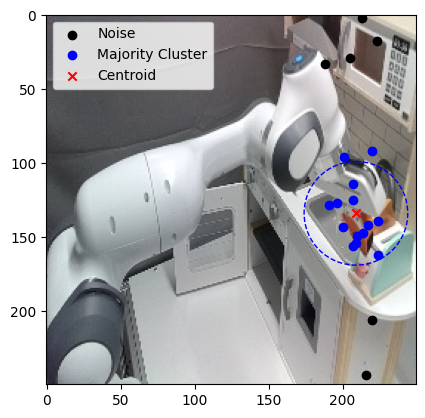

Task: 2
move the fruit from the left stove to the sink


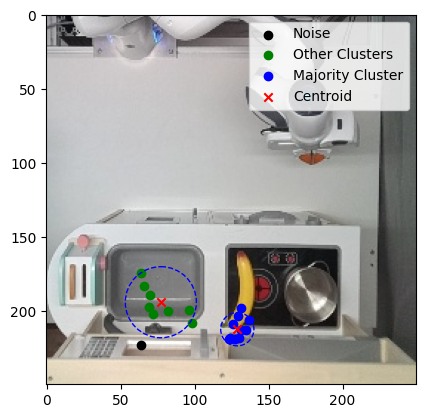

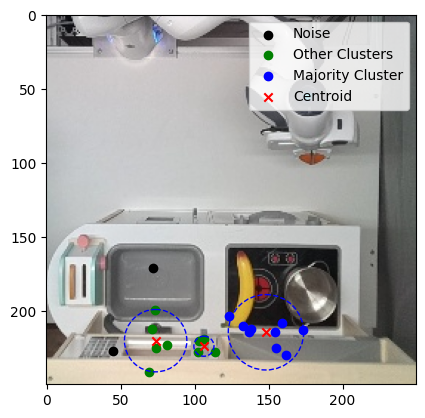

Task: 3
open low fridge


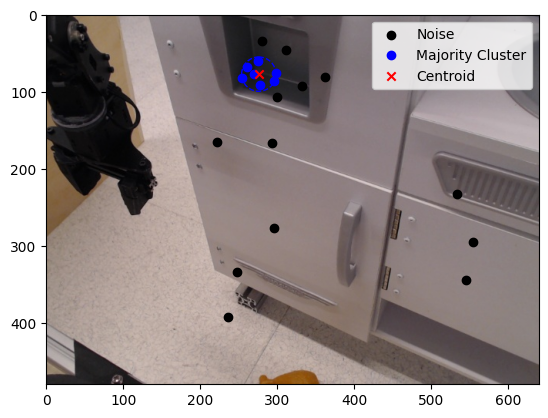

Task: 4
open the drawer


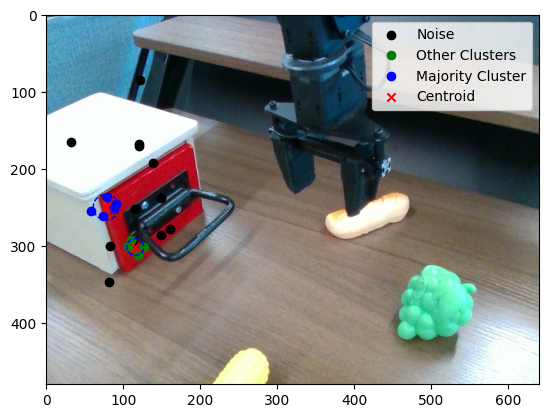

Task: 5
Move the can from the top left of the burner to the bottom left of the burner


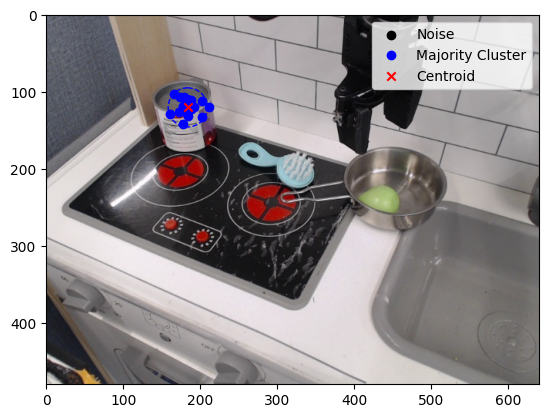

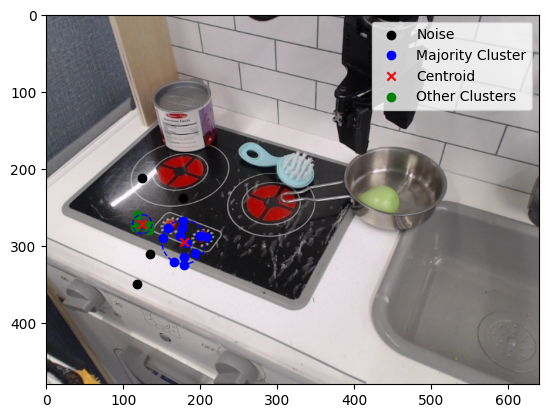

Task: 6
Place the pot to the right of the blue fork.


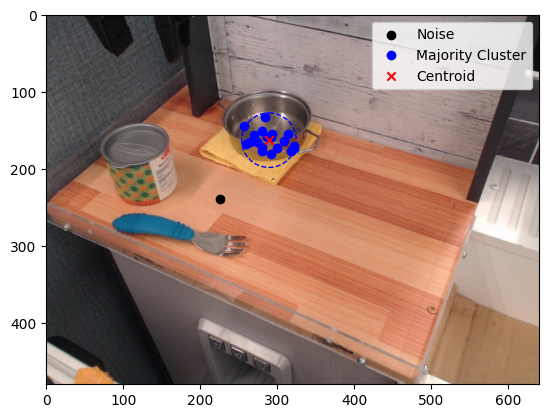

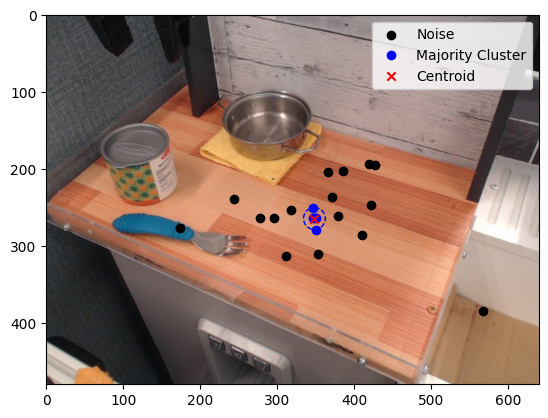

Task: 7
move the pot from the right to the left stove


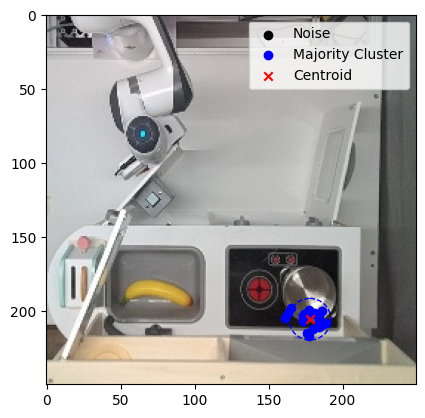

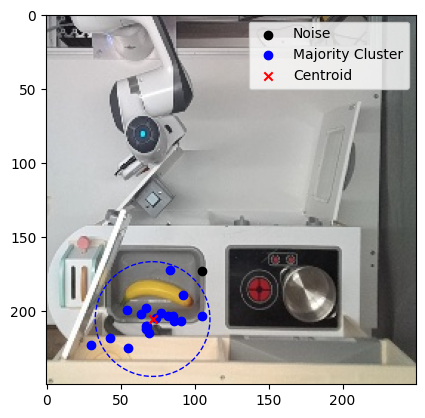

Task: 8
put potato in pot or pan


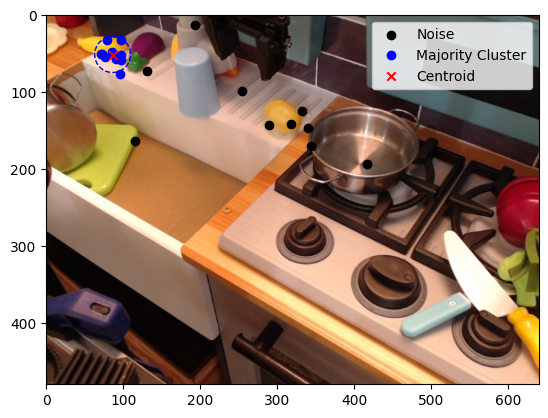

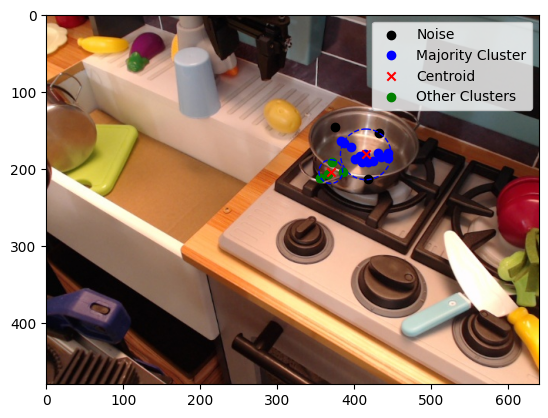

Task: 9
take cucumber out of cup


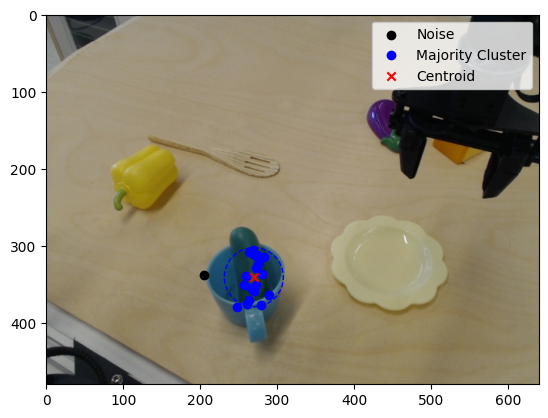

Task: 10
move the banana from the left stove to the sink


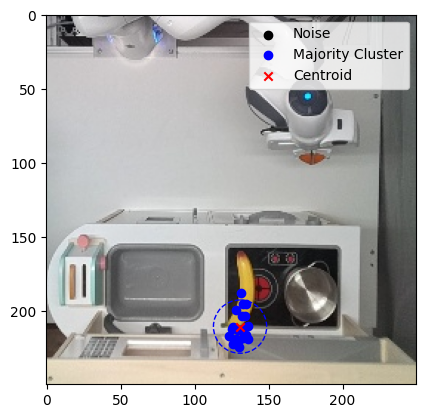

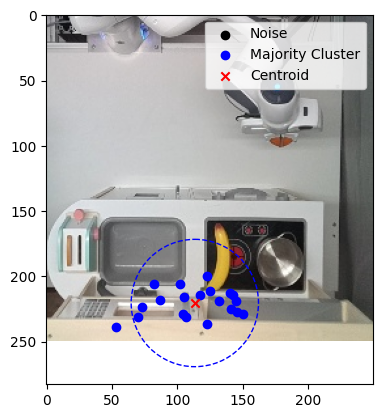

Task: 11
pick up the toast and put it to the sink


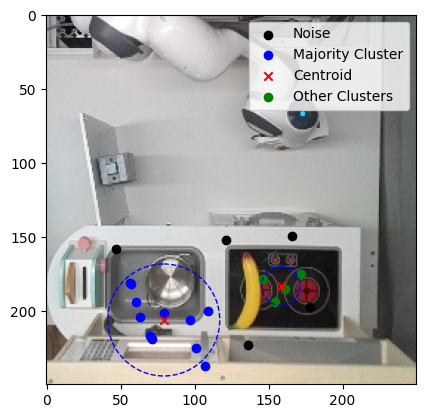

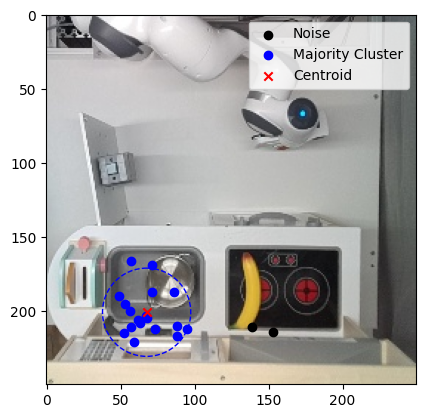

Task: 12
close the microwave


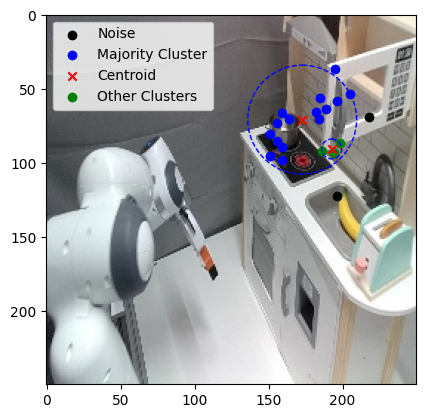

Task: 13
push the toaster lever


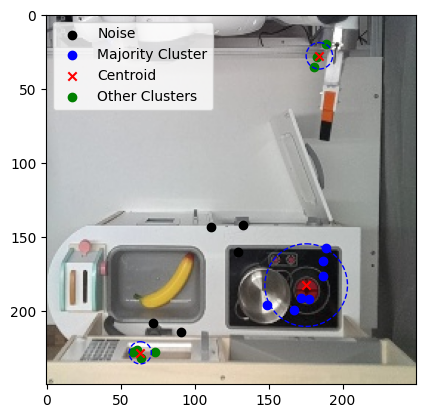

Task: 14
pick up glass cup


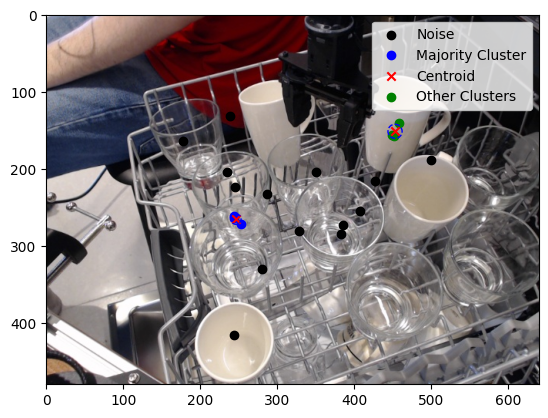

Task: 15
take the broccoli and put it between the two right burners


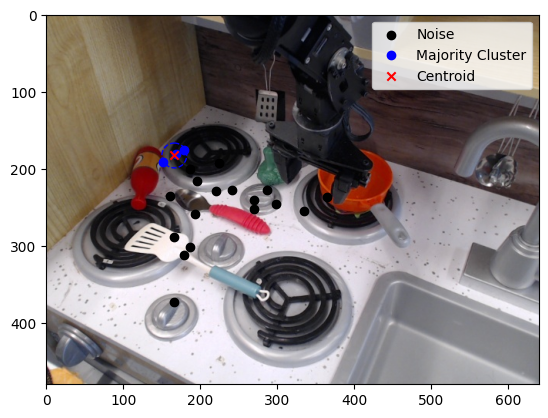

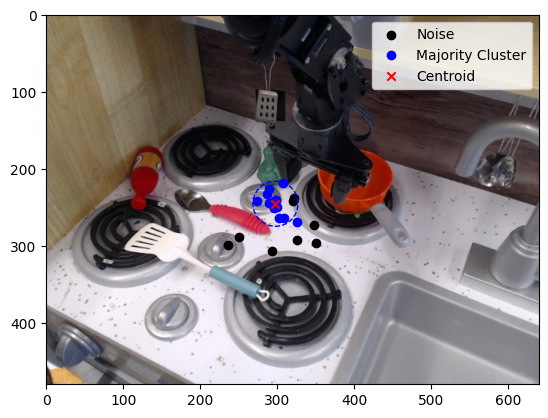

Task: 16
move the pot from the left to the right stove


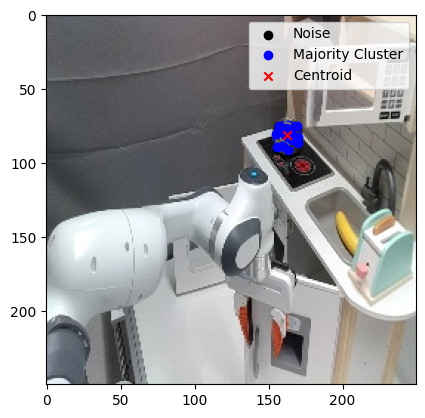

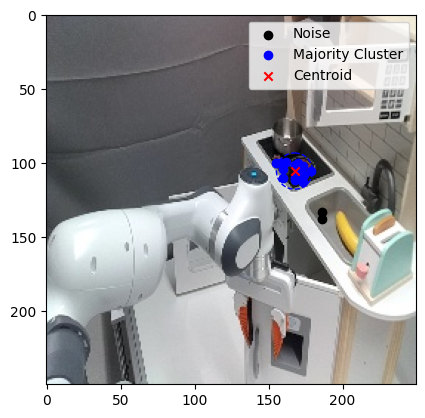

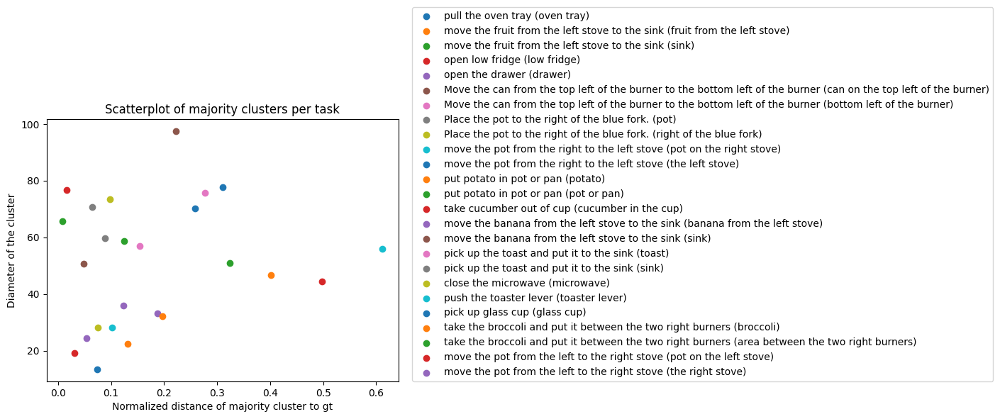

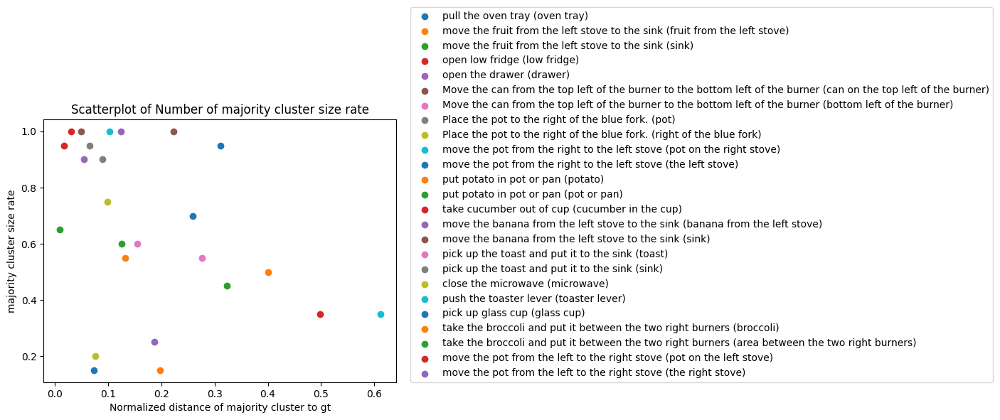

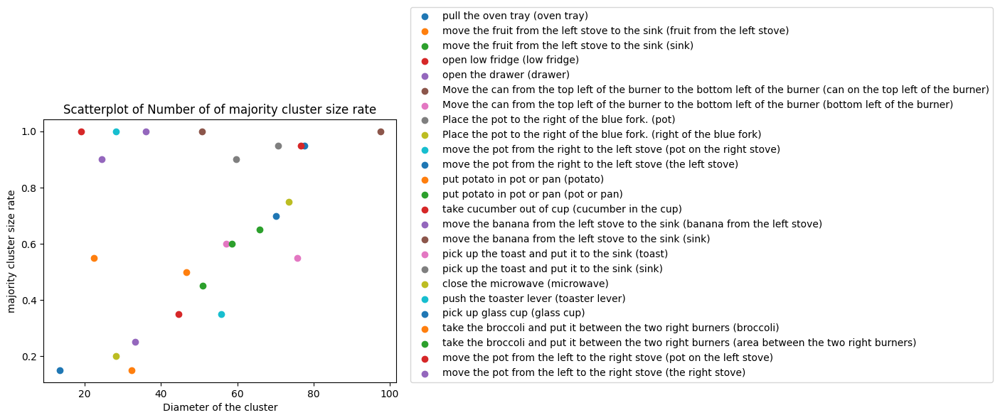

In [12]:
PROMPTS = [
    "Locate several points within the space of the ",
    "Locate several points within the area of the ",
    "Identify multiple points within the space of the ",
    "Identify several points within the area of the ",
    "Identify several spots within the space of the "
]

TEMPERATURES = [
    0.6
]


run_cluster_experiment(
    prompts = PROMPTS,
    temperatures = TEMPERATURES,
    runs_per_instance = 4,
    epsilon = 20,
    min_samples = 3,
    experiment_path = "../data/base_experiments"
)

In [ ]:
close_all_images("../data")